# Дневник улучшений

Точность полученных предсказаний определялась с помощью метрики accuracy_score.

Точка отсчета (baseline with 1500 iterations): 0.9404

1) Понижение размерности:
- UMAP 2D + UMAP-компоненты как признаки:  0.9397 (-0.0007)
- UMAP 3D + UMAP-компоненты как признаки: 0.9409 (+0.0005)

2) Кластеризация:
- HDBSCAN на основе 3D UMAP-компонент: 0.9419 (+0.0010)

3) AutoML:
- 0.9473 (+0.0054)


### Итоговый скор: 0.9473


In [2]:
import pandas as pd
import numpy as np
import os

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

import catboost
from catboost import CatBoostClassifier

from supervised import AutoML

import umap
import hdbscan
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from matplotlib.colors import ListedColormap
import plotly.express as px

import warnings

Чтение всех датасетов и объединение их в один общий:

In [3]:
dfs = []

for i in range(1, 106):
    
    filename = f"{i}_w.csv"
    df = pd.read_csv(f"route1/{i}_w.csv", sep=';', encoding='cp1251')
    df['source_file'] = filename
    dfs.append(df)

# Объединяем все датафреймы
combined_df = pd.concat(dfs, ignore_index=True)

combined_df

,len,Скорость,Широта,Долгота,Высота,X Rotation,Y Rotation,Вес мгновенный,"Уровень топлива, литры","Уровень топлива, проценты",...,incline,рекомендованная скорость_min,рекомендованная скорость_max,new_slope,incline_,indicator_slope,mean_slope,shtraf,source_file,isin_border
0,0.0,8.000000,60.646058,59.714841,334.00,79.736983,-0.466904,99.0,NaN,92.8,...,up,0.0,0.0,1.728200,up,0,0.010000,0.000000,1_w.csv,NaN
1,2.0,8.000000,60.646048,59.714865,333.90,78.123769,-4.759739,99.0,NaN,92.8,...,up,0.0,0.0,2.085185,up,0,0.010000,0.000000,1_w.csv,NaN
2,4.0,9.000000,60.646032,59.714886,334.00,84.516539,-0.780620,99.0,NaN,92.8,...,up,9.0,0.0,2.135208,up,0,0.010000,0.000000,1_w.csv,NaN
3,7.0,9.000000,60.646012,59.714915,334.30,83.064053,-3.043537,99.0,NaN,92.8,...,up,9.5,0.0,1.983704,up,0,0.010000,0.000000,1_w.csv,NaN
4,9.0,9.000000,60.645999,59.714938,334.10,85.258071,-1.037494,99.0,NaN,92.8,...,up,0.0,0.0,1.716917,up,0,1.983074,0.388857,1_w.csv,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70018,3986.0,3.690909,60.661784,59.732732,454.20,83.495558,-2.707034,122.0,1877.0,95.6,...,flat,0.0,0.0,1.600000,flat,3,0.010000,17.592657,105_w.csv,1.0
70019,3987.0,4.200000,60.661793,59.732722,454.10,86.490057,-1.845599,121.0,1877.0,95.6,...,flat,0.0,0.0,1.600000,flat,3,0.010000,17.738051,105_w.csv,1.0
70020,3988.0,4.709091,60.661805,59.732710,454.00,83.649269,-2.620879,123.0,1877.0,95.6,...,flat,0.0,0.0,1.600000,flat,3,0.010000,17.449627,105_w.csv,1.0
70021,3989.0,5.218182,60.661811,59.732706,454.40,86.541325,-0.021899,122.0,1877.0,95.6,...,flat,0.0,0.0,1.600000,flat,3,0.010000,17.592657,105_w.csv,1.0


По заданию требуется не рассматривать тэги с названием "Давление" в качестве предикторов, поэтому исключим данные столбцы. Также удалим столбцы folder, border_lists и полностью пустые столбцы.

In [235]:
pressure_columns = [col for col in combined_df.columns if 'Давление' in col]
combined_df = combined_df.drop(columns=pressure_columns)
combined_df = combined_df.drop(columns=['folder', 'border_lists'])

empty_columns = combined_df.columns[combined_df.isnull().all()]
combined_df = combined_df.drop(columns=empty_columns)

Сделаем преобразование категориальных признаков в числовые.

In [236]:
cat_cols = list(combined_df.select_dtypes(include=['object']).columns)
cat_cols.remove('source_file')
cat_cols.remove('point')

# Преобразование категориальных признаков в числовые
label_encoders = {}
for col in cat_cols:
    le = LabelEncoder()
    combined_df[col] = le.fit_transform(combined_df[col].astype(str)) 

Разделим датасет на train и val. В train пойдут датасеты из файлов 1_w.csv - 84_w.csv, а в val пойдут 85_w.csv - 105_w.csv

$\frac{train}{val} = \frac{80}{20}$

Делить данные на train и val нужно именно по файлам, а не с помощью train_test_split(shuffle=True), так как для одной поездки карьерного самосвала две ближайшие строчки данных имеют очень похожие значения (многие даже совпадают), и мы не сможем релевантно валидироваться (значения accuracy на валидации будут около 0.999).

In [88]:
# Создаем маски для разделения
train_mask = combined_df['source_file'].apply(lambda x: int(x.split('_')[0]) <= 84)
val_mask = ~train_mask  # инвертируем маску

# Разделяем данные
train_df = combined_df[train_mask].copy()
val_df = combined_df[val_mask].copy()

X_train = train_df.drop(['point', 'source_file'], axis=1)
X_val = val_df.drop(['point', 'source_file'], axis=1)
y_train = train_df.point
y_val = val_df.point

## Понижение размерности

В данном пункте нормализуем данные и используем понижение размерности для создания новых признаков. Проверим понижение размерности до 2 и 3 компонент.

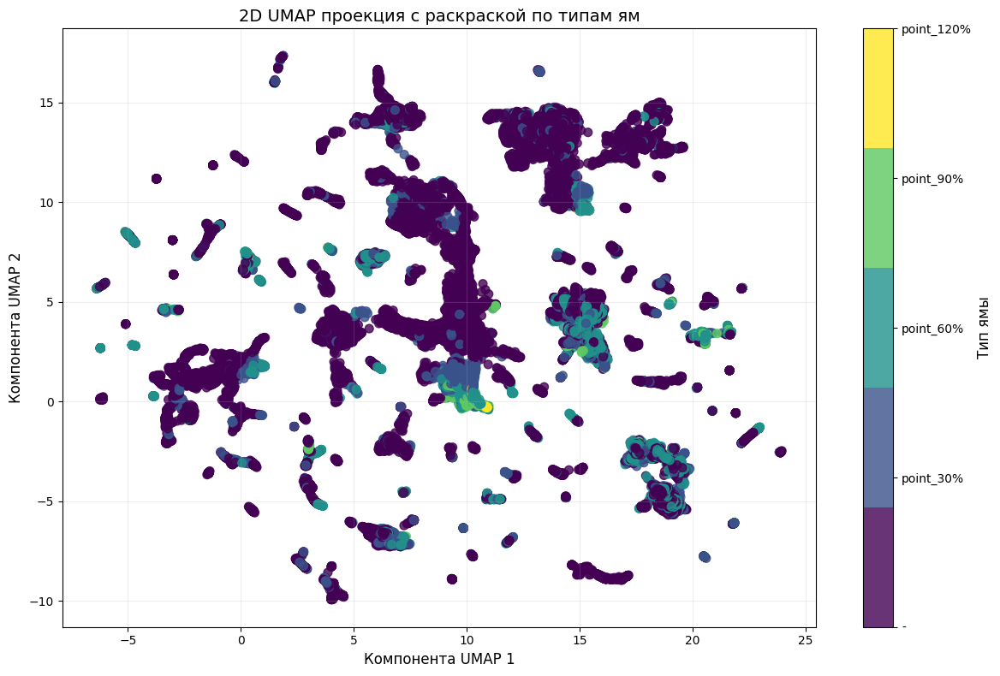

In [238]:
warnings.filterwarnings("ignore", category=UserWarning, module="umap")
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")

normalized_train = (X_train - X_train.mean()) / X_train.std()
normalized_val = (X_val - X_train.mean()) / X_train.std()

# 1. Понижение размерности
reducer = umap.UMAP(n_components=2, random_state=42)

X_umap_train = reducer.fit_transform(normalized_train.fillna(0))
X_umap_val = reducer.transform(normalized_val.fillna(0))

# 2. Добавляем UMAP-компоненты к исходным данным
X_train.loc[:, 'umap_2d_1'] = X_umap_train[:, 0]
X_train.loc[:, 'umap_2d_2'] = X_umap_train[:, 1]
X_val.loc[:, 'umap_2d_1'] = X_umap_val[:, 0]
X_val.loc[:, 'umap_2d_2'] = X_umap_val[:, 1]

targets = ['-', 'point_30%', 'point_60%', 'point_90%', 'point_120%']

# Создаем числовое представление меток
label_to_num = {label: i for i, label in enumerate(targets)}
numeric_labels = np.array([label_to_num[label] for label in y_train])

# Создаем цветовую карту
cmap = plt.get_cmap('viridis', len(label_to_num))

plt.figure(figsize=(12, 8))
scatter = plt.scatter(X_umap_train[:, 0], X_umap_train[:, 1], 
                     c=numeric_labels, cmap=cmap, alpha=0.8, s=50)

# Создаем цветовую шкалу с категориальными метками
cbar = plt.colorbar(scatter, ticks=np.arange(len(label_to_num)))
cbar.set_ticklabels(list(label_to_num.keys()))
cbar.set_label('Тип ямы', fontsize=12)
cbar.ax.tick_params(labelsize=10)  # Размер шрифта меток

plt.title('2D UMAP проекция с раскраской по типам ям', fontsize=14)
plt.xlabel('Компонента UMAP 1', fontsize=12)
plt.ylabel('Компонента UMAP 2', fontsize=12)
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

Использование 2d UMAP-компонент в качестве признаков ухудшило скор на 0.0007. В дальнейшем эти признаки не будем использовать.

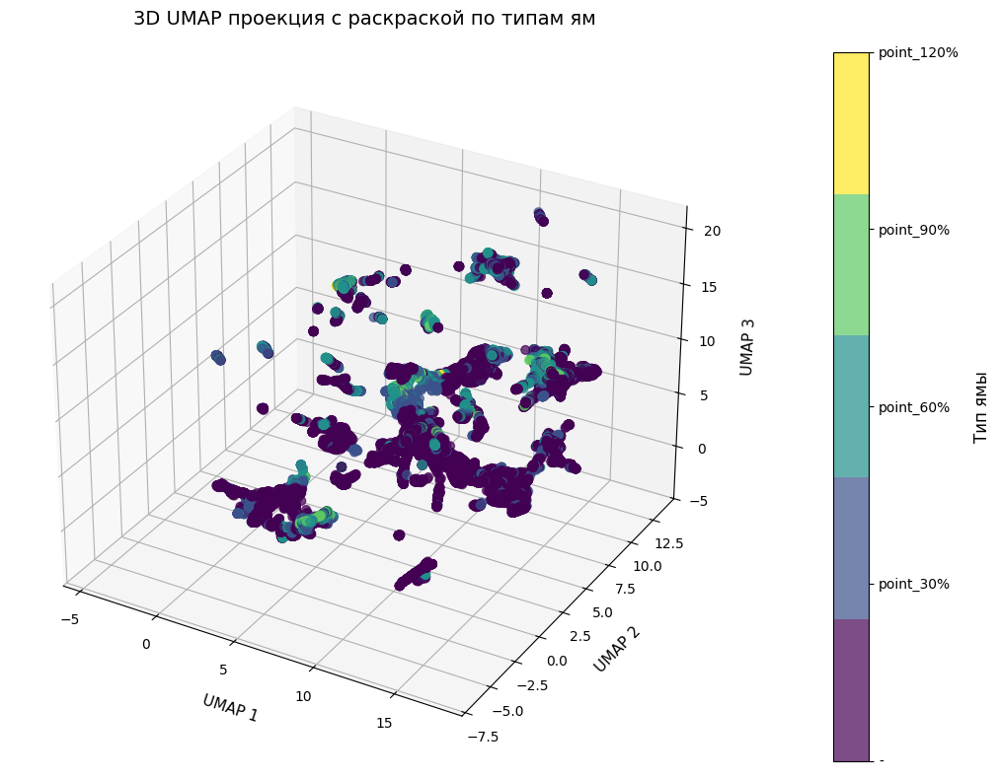

In [244]:
# Применение UMAP
reducer = umap.UMAP(n_components=3, random_state=42)

X_umap = reducer.fit_transform(normalized_train.fillna(0))
X_val_umap = reducer.transform(normalized_val.fillna(0))

# Добавление компонентов к данным
for i in range(3):
    X_train[f'umap_3d_{i}'] = X_umap[:, i].copy()
    X_val[f'umap_3d_{i}'] = X_val_umap[:, i].copy()

# Визуализация (3D)
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Создаем scatter plot
scatter = ax.scatter(
    X_umap[:, 0], 
    X_umap[:, 1], 
    X_umap[:, 2], 
    c=numeric_labels, 
    cmap=cmap,
    alpha=0.7,
    s=40,
    depthshade=True
)

# Настраиваем цветовую шкалу
cbar = fig.colorbar(
    scatter, 
    ax=ax, 
    pad=0.1, 
    ticks=np.linspace(0, len(targets)-1, len(targets))
)
cbar.set_ticklabels(targets)
cbar.set_label('Тип ямы', fontsize=12, labelpad=10)
cbar.ax.tick_params(labelsize=10)

# Настраиваем подписи и вид
ax.set_xlabel('UMAP 1', fontsize=11, labelpad=10)
ax.set_ylabel('UMAP 2', fontsize=11, labelpad=10)
ax.set_zlabel('UMAP 3', fontsize=11, labelpad=10)
ax.set_title('3D UMAP проекция с раскраской по типам ям', fontsize=14, pad=20)

ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Использование 3d UMAP-компонент в качестве признаков улучшило скор на 0.0005. В дальнейшем эти признаки будем использовать отдельно для кластеризации и для обучения модели классификации.

## Кластеризация

Для кластеризации 3d UMAP-компонент будем использовать HDBSCAN.

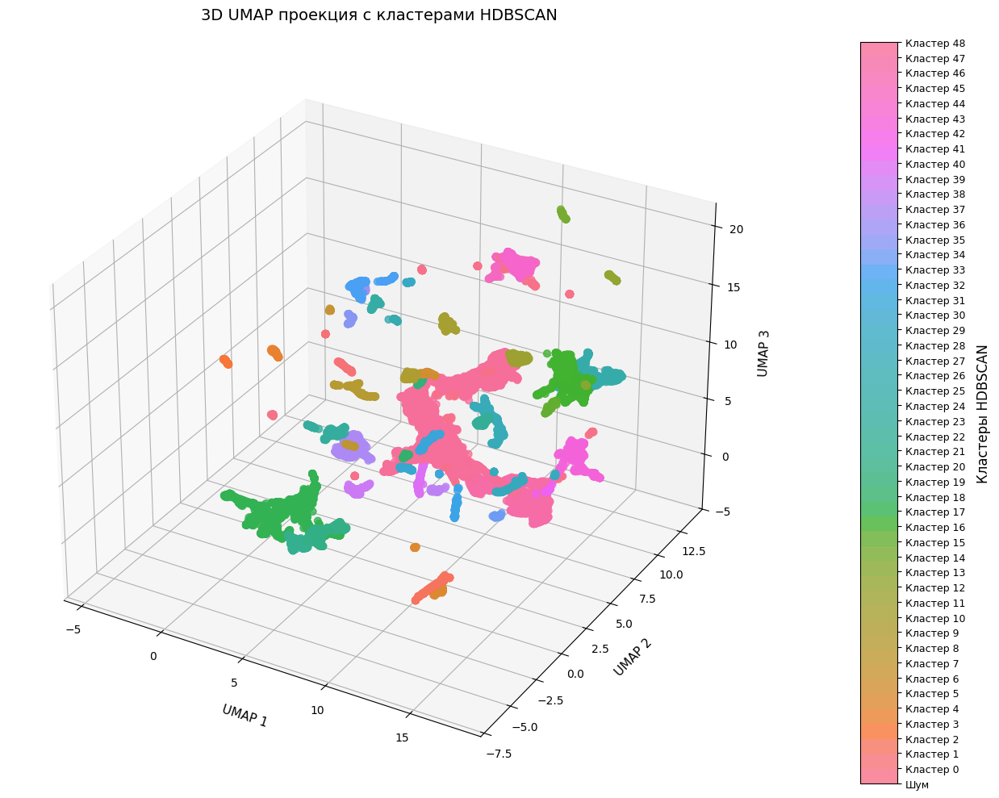

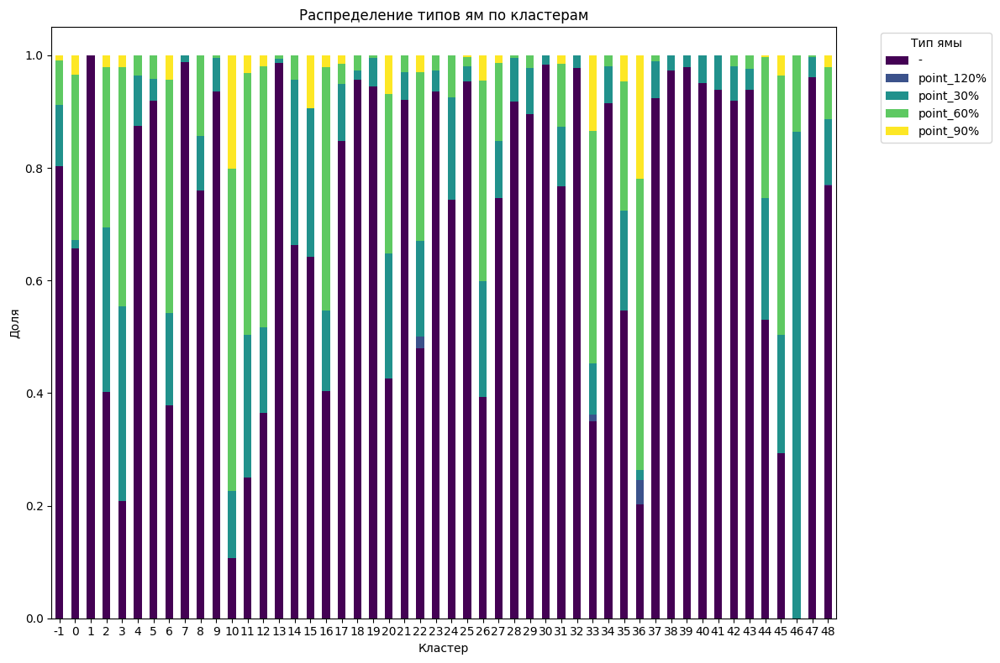

In [277]:
# 1. Кластеризация HDBSCAN
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=100,       # Минимальный размер кластера
    min_samples=20,            # Чувствительность к шуму
    cluster_selection_epsilon=0.5,  # Максимальное расстояние между точками в кластере
    gen_min_span_tree=True,
    prediction_data=True
)

cluster_labels = clusterer.fit_predict(X_umap)
val_labels, val_probs = hdbscan.approximate_predict(clusterer, X_val_umap)

# Добавляем метки кластеров в датасет
X_train['cluster'] = cluster_labels
X_val['cluster'] = val_labels

# 2. Визуализация кластеров
# Генерируем цветовую карту для кластеров
unique_clusters = np.unique(cluster_labels)
colors = sns.color_palette('husl', n_colors=len(unique_clusters))
cmap = ListedColormap(colors)

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    X_umap[:, 0], 
    X_umap[:, 1], 
    X_umap[:, 2], 
    c=cluster_labels, 
    cmap=cmap,
    alpha=0.8,
    s=40,
    depthshade=True
)

# Настраиваем цветовую шкалу
cbar = fig.colorbar(
    scatter, 
    ax=ax, 
    pad=0.1, 
    ticks=unique_clusters
)
cbar.set_ticklabels([f'Кластер {c}' if c != -1 else 'Шум' for c in unique_clusters])
cbar.set_label('Кластеры HDBSCAN', fontsize=12, labelpad=10)
cbar.ax.tick_params(labelsize=9)

# Настраиваем подписи и вид
ax.set_xlabel('UMAP 1', fontsize=11, labelpad=10)
ax.set_ylabel('UMAP 2', fontsize=11, labelpad=10)
ax.set_zlabel('UMAP 3', fontsize=11, labelpad=10)
ax.set_title('3D UMAP проекция с кластерами HDBSCAN', fontsize=14, pad=20)

ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 3. Дополнительная визуализация: связь кластеров с целевой переменной

fig, ax = plt.subplots(figsize=(12, 8))
cluster_target_corr = pd.crosstab(X_train['cluster'], y_train, normalize='index')
cluster_target_corr.plot(kind='bar', stacked=True, ax=ax, colormap='viridis')
ax.set_title('Распределение типов ям по кластерам')
ax.set_xlabel('Кластер')
ax.set_ylabel('Доля')
ax.legend(title='Тип ямы', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Получилось 50 кластеров (49 + шум). Для лучшего исследования используем интерактивную визуализацию с Plotly.

In [ ]:
plot_df = pd.DataFrame({
    'UMAP1': X_umap[:, 0],
    'UMAP2': X_umap[:, 1],
    'UMAP3': X_umap[:, 2],
    'Cluster': X_train['cluster'],
    'Target': y_train 
})

fig = px.scatter_3d(
    plot_df, 
    x='UMAP1', 
    y='UMAP2', 
    z='UMAP3',
    color='Cluster',
    hover_data=['Target'],
    height=600,
    width=1000
)

fig.update_traces(
    marker=dict(
        size=5,
        line=dict(width=0.5, color='DarkSlateGrey')
    ),
    selector=dict(mode='markers')
)

fig.update_layout(
    title='Interactive 3D Cluster Visualization',
    scene=dict(
        xaxis_title='UMAP1',
        yaxis_title='UMAP2',
        zaxis_title='UMAP3'
    )
)

fig.show()

Использование HDBSCAN-кластеризации в качестве признака улучшило скор на 0.0010. В дальнейшем будем использовать этот признак для обучения модели классификации.

## Обучение базовой модели классификации

Для проверки полезности UMAP-компонент и HDBSCAN-компоненты (кластеризация) использовался CatBoostClassifier с iterations=1500. 

In [9]:
train_pool = catboost.Pool(
    X_train,
    label=y_train,
)
eval_pool = catboost.Pool(
    X_val,
    label=y_val,
)

In [10]:
model = CatBoostClassifier(
    iterations=1500,
    random_state=42,
    verbose=100,
    eval_metric='Accuracy',
)
model.fit(train_pool,
        eval_set=eval_pool,
        use_best_model=True)

Learning rate set to 0.100198
0:	learn: 0.9124825	test: 0.9063288	best: 0.9063288 (0)	total: 84.5ms	remaining: 2m 6s
100:	learn: 0.9793445	test: 0.9332626	best: 0.9355181 (79)	total: 1.9s	remaining: 26.3s
200:	learn: 0.9903729	test: 0.9373093	best: 0.9375083 (192)	total: 3.66s	remaining: 23.7s
300:	learn: 0.9942128	test: 0.9377073	best: 0.9383044 (255)	total: 5.44s	remaining: 21.7s
400:	learn: 0.9960691	test: 0.9385697	best: 0.9386361 (398)	total: 7.17s	remaining: 19.6s
500:	learn: 0.9974340	test: 0.9391668	best: 0.9392995 (498)	total: 8.92s	remaining: 17.8s
600:	learn: 0.9982711	test: 0.9401619	best: 0.9403609 (546)	total: 10.6s	remaining: 15.9s
700:	learn: 0.9987443	test: 0.9404936	best: 0.9406926 (662)	total: 12.4s	remaining: 14.1s
800:	learn: 0.9990537	test: 0.9408253	best: 0.9410243 (726)	total: 14.1s	remaining: 12.3s
900:	learn: 0.9993812	test: 0.9403609	best: 0.9410906 (814)	total: 15.8s	remaining: 10.5s
1000:	learn: 0.9996360	test: 0.9408253	best: 0.9411570 (968)	total: 17.5s	r

## AutoML

Для оптимизации поиска гиперпараметров, важных признаков и генерации новых признаков будем использовать AutoML от MLJAR. Ансамбль моделей будет состоять из моделей с различными гиперпараметрами CatBoost и LightGBM. Также AutoML сам убирает маловажные признаки (если это необходимо) и генерирует новые признаки (делая различные операции с имеющимися признаками).

В данный AutoML нельзя отдельно подать train и val части, поэтому для начала объединим их в один общий датасет, и потом уже AutoML сам разделит на train и val части с помощью validation_strategy. train_ratio = 0.78473 специально подобрался мной, чтобы разделение было такое же, какое было выше при обучении базовой модели (в train пойдут датасеты из файлов 1_w.csv - 84_w.csv, а в val пойдут 85_w.csv - 105_w.csv). Также добавим в val точку с таргетом 'point_120%', чтобы не появлялась ошибка о разности количества классов (в 85_w.csv - 105_w.csv нет ни одного таргета 'point_120%').

In [77]:
X = pd.concat([X_train, X_val, X_train.loc[41087:41087]], ignore_index=True)
y = pd.concat([y_train, y_val, y.loc[41087:41087]], ignore_index=True)

In [80]:
automl = AutoML(mode="Compete", 
                algorithms=["CatBoost", 'LightGBM'], 
                eval_metric='accuracy',
                total_time_limit=5400,
                validation_strategy = {
                    "validation_type": "split",
                    "train_ratio": 0.78473,
                    "shuffle": False
                },
                random_state=42)
automl.fit(X, y)

Disable stacking for split validation
AutoML directory: AutoML_1
The task is multiclass_classification with evaluation metric accuracy
AutoML will use algorithms: ['CatBoost', 'LightGBM']
AutoML will ensemble available models
AutoML steps: ['simple_algorithms', 'default_algorithms', 'not_so_random', 'golden_features', 'kmeans_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'ensemble']
Skip simple_algorithms because no parameters were generated.
* Step default_algorithms will try to check up to 2 models
1_Default_LightGBM accuracy 0.938308 trained in 8.61 seconds
2_Default_CatBoost accuracy 0.93791 trained in 2.09 seconds
* Step not_so_random will try to check up to 18 models
3_LightGBM accuracy 0.934793 trained in 16.75 seconds
12_CatBoost accuracy 0.934328 trained in 1.73 seconds
4_LightGBM accuracy 0.938308 trained in 6.01 seconds
13_CatBoost accuracy 0.937446 trained in 2.19 seconds
5_LightGBM accuracy 0.933002 trained in 4.73 seconds


,results_path,None
,total_time_limit,5400
,mode,'Compete'
,ml_task,'auto'
,model_time_limit,None
,algorithms,"['CatBoost', 'LightGBM']"
,train_ensemble,True
,stack_models,'auto'
,eval_metric,'accuracy'
,validation_strategy,"{'shuffle': False, 'train_ratio': 0.78473, 'validation_type': 'split'}"
,explain_level,'auto'


In [81]:
automl.report()

Best model,name,model_type,metric_type,metric_value,train_time
,1_Default_LightGBM,LightGBM,accuracy,0.938308,9.03
,2_Default_CatBoost,CatBoost,accuracy,0.93791,2.48
,3_LightGBM,LightGBM,accuracy,0.934793,17.21
,12_CatBoost,CatBoost,accuracy,0.934328,2.1
,4_LightGBM,LightGBM,accuracy,0.938308,6.46
,13_CatBoost,CatBoost,accuracy,0.937446,2.58
,5_LightGBM,LightGBM,accuracy,0.933002,5.14
,14_CatBoost,CatBoost,accuracy,0.934726,3.08
,6_LightGBM,LightGBM,accuracy,0.939171,15.23
,15_CatBoost,CatBoost,accuracy,0.934859,2.74


In [82]:
predictions = automl.predict_all(X_val)

In [83]:
predictions

,prediction_-,prediction_point_120%,prediction_point_30%,prediction_point_60%,prediction_point_90%,label
0,0.913307,0.017575,0.024008,0.026514,0.018596,-
1,0.913809,0.017514,0.023958,0.026186,0.018532,-
2,0.914605,0.017512,0.023683,0.025710,0.018490,-
3,0.913617,0.017516,0.023947,0.026378,0.018542,-
4,0.913995,0.017511,0.023946,0.026033,0.018515,-
...,...,...,...,...,...,...
15069,0.083086,0.020637,0.076168,0.774465,0.045643,point_60%
15070,0.083281,0.020624,0.075980,0.774495,0.045621,point_60%
15071,0.083278,0.020692,0.076158,0.774107,0.045764,point_60%
15072,0.083076,0.020619,0.075912,0.774752,0.045641,point_60%


In [84]:
print("Val accuracy:", accuracy_score(y_val, predictions["label"]))

Val accuracy: 0.947326522489054


Можно увидеть, что AutoML помог значительно улучшить метрику (+0.0054). 

Если нажать на "Ensemble" в automl.report(), то можно увидеть какие модели с какими весами вошли в финальный ансамбль. Также можно нажать на отдельные модели, чтобы увидеть их гиперпараметры. В итоге, финальный ансамбль выглядит так:


| Model               | Weight |
|---------------------|--------|
| 10_LightGBM        | 1      |
| 17_CatBoost        | 2      |
| 18_CatBoost        | 1      |
| 1_Default_LightGBM | 2      |
| 22_LightGBM        | 1      |
| 23_LightGBM        | 2      |
| 24_LightGBM        | 1      |
| 25_LightGBM        | 2      |
| 30_CatBoost        | 2      |
| 38_CatBoost        | 1      |
| 5_LightGBM         | 1      |
| 9_LightGBM         | 2      |